/opt/anaconda3/envs/opendrift/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
23:17:41 INFO    opendrift:576: OpenDriftSimulation initialised (version 1.14.6)
23:17:41 INFO    opendrift.models.basemodel.environment:203: Adding a global landmask from GSHHG
23:17:45 INFO    opendrift.models.basemodel.environment:227: Fallback values will be used for the following variables which have no readers: 
23:17:45 INFO    opendrift.models.basemodel.environment:230: 	x_sea_water_velocity: 0.000000
23:17:45 INFO    opendrift.models.basemodel.environment:230: 	y_sea_water_velocity: 0.000000
23:17:45 INFO    opendrift.models.basemodel.environment:230: 	sea_surface_height: 0.000000
23:17:45 INFO    opendrift.models.basemodel.environment:230: 	sea_surface_wave_significant_height: 0.000000
23:17:45 INFO    opendrift.mode

--------------------
Reader performance:
--------------------
global_landmask
 0:00:01.1  total
 0:00:00.0  preparing
 0:00:01.0  reading
 0:00:00.0  masking
--------------------
https://tds.hycom.org/thredds/dodsC/FMRC_ESPC-D-V02_uv3z/FMRC_ESPC-D-V02_uv3z_best.ncd
 0:01:13.9  total
 0:00:00.0  preparing
 0:01:13.9  reading
 0:00:00.4  interpolation
 0:00:00.0  interpolation_time
 0:00:00.0  masking
--------------------
https://pae-paha.pacioos.hawaii.edu/thredds/dodsC/ncep_global/NCEP_Global_Atmospheric_Model_best.ncd
 0:00:17.3  total
 0:00:00.0  preparing
 0:00:17.3  reading
 0:00:00.0  interpolation
 0:00:00.0  interpolation_time
 0:00:00.0  masking
--------------------
Performance:
 1:47.5 total time
    4.4 configuration
    1.0 preparing main loop
      1.0 moving elements to ocean
 1:42.0 main loop
      0.9 updating elements
        0.8 vertical mixing
    0.0 cleaning up
--------------------
Model:	PhytoplanktonDrift     (OpenDrift version 1.14.6)
	500 active Phyto particles 

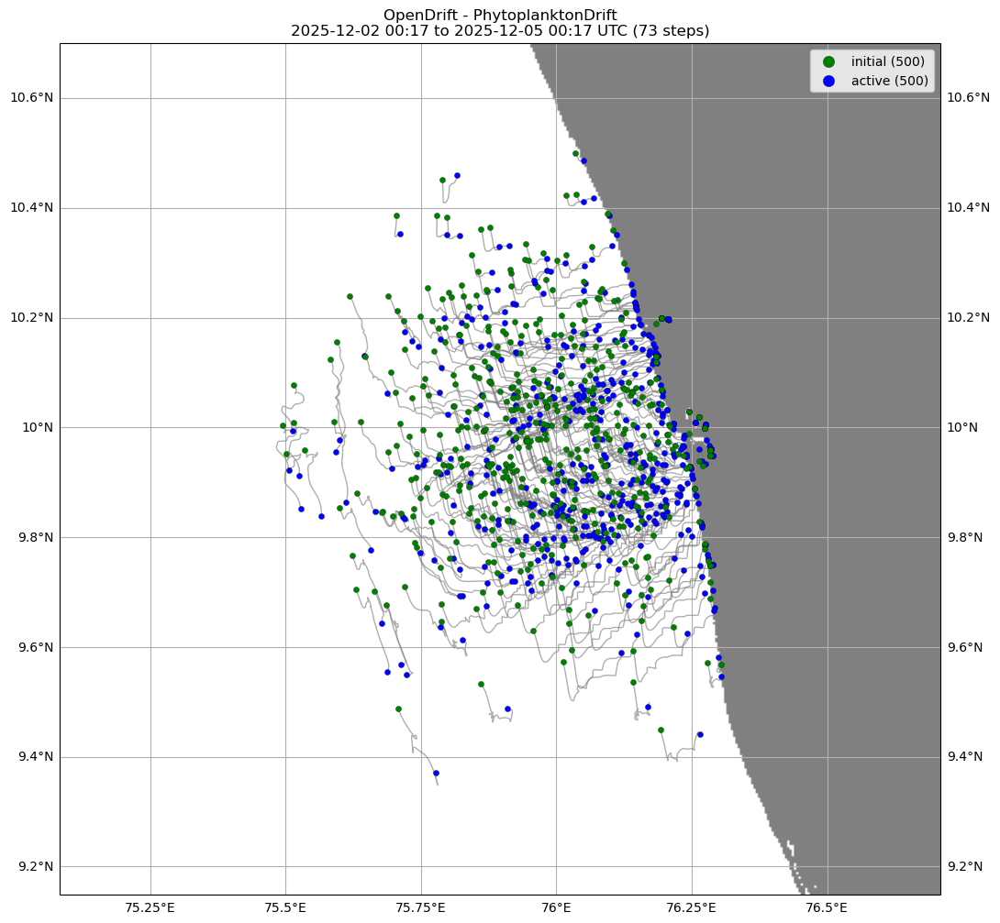

23:19:31 WARNING opendrift:2469: Plotting fast. This will make your plots less accurate.
23:19:32 INFO    opendrift:3107: Preparing animation for notebook....


23:20:27 INFO    opendrift:3080: Time to make animation: 0:00:55.818160
23:20:27 INFO    opendrift:3107: Preparing animation for notebook....


23:20:42 INFO    opendrift.models.oceandrift:643: Time to make animation: 0:00:15.356713


In [24]:
"""
Cod egg
=============
"""

from opendrift.readers import reader_netCDF_CF_generic
from opendrift.models.phyto import PhytoplanktonDrift
from datetime import datetime, timedelta

o = PhytoplanktonDrift(loglevel=20)  # Set loglevel to 0 for debug information

#Forcing with Topaz ocean model and MEPS atmospheric model
o.add_readers_from_list([
    'https://tds.hycom.org/thredds/dodsC/FMRC_ESPC-D-V02_uv3z/FMRC_ESPC-D-V02_uv3z_best.ncd',
    'https://pae-paha.pacioos.hawaii.edu/thredds/dodsC/ncep_global/NCEP_Global_Atmospheric_Model_best.ncd'])

#%%
# Adjusting some configuration
o.set_config('drift:vertical_mixing', True)
o.set_config('vertical_mixing:diffusivitymodel', 'windspeed_Sundby1983') # windspeed parameterization for eddy diffusivity
#%%
# Vertical mixing requires fast time step
o.set_config('vertical_mixing:timestep', 60.) # seconds

#%%
# spawn NEA cod eggs at defined position and time
time = datetime.now()
o.seed_elements(76 , 10, z=0, radius=20000, number=500,
                time=time, diameter=0.0014, density=1050)
#o.seed_elements(76, 9, z=0, radius=200, number=500,
 #               time=time, diameter=0.0014, density=1050)
# o.seed_elements(13.5, 68., z=0, radius=2000, number=500,
#                 time=time, diameter=0.0014, density=1050)
# o.seed_elements(13., 67.8, z=0, radius=2000, number=500,
#                 time=time, diameter=0.0014, density=1050)

# #%%
# Running model
model_run = o.run(duration=timedelta(hours=72), time_step=3600)

#%%
# Print and plot results.
# At the end the wind vanishes, and eggs come to surface
print(o)

o.plot(fast=True)
o.animation(fast=True, color='z')

#%%
# .. image:: /gallery/animations/example_codegg_0.gif

#%% Vertical distribution of particles
o.animate_vertical_distribution()

#%%
# .. image:: /gallery/animations/example_codegg_1.gif


00:24:09 WARNING py.warnings:230: /var/folders/mf/6gftk9cs5cj9wfw8h2d7_3hr0000gn/T/ipykernel_69117/3969944016.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])



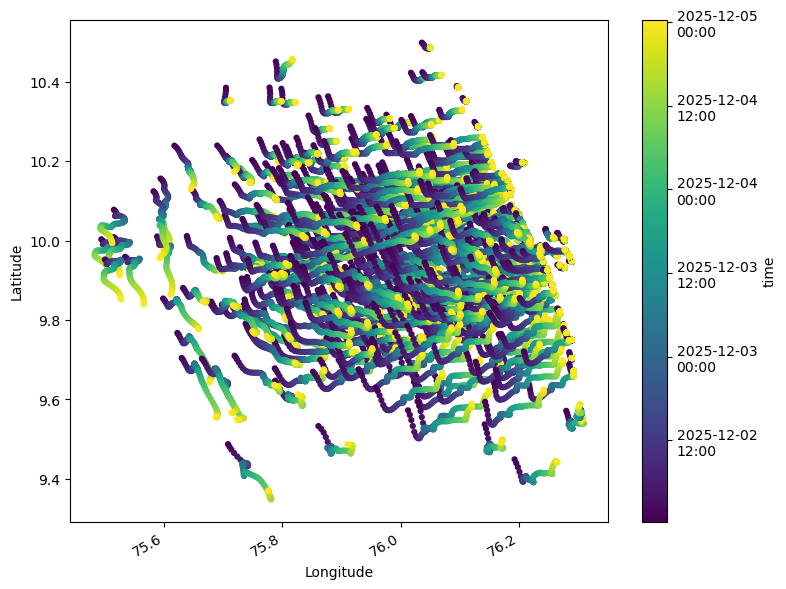

In [157]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert xarray Dataset to a DataFrame and bring the index levels (trajectory, time) into columns
testdata = model_run.to_dataframe().reset_index()

# Color the scatter by time: convert datetimes to matplotlib numeric values
time_nums = mdates.date2num(testdata['time'])

plt.figure(figsize=(8, 6))
sc = plt.scatter(testdata['lon'], testdata['lat'], c=time_nums, cmap='viridis', marker='o', s=12)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a colorbar showing the time (formatted)
cbar = plt.colorbar(sc)
cbar.set_label('time')
cbar_ticks = cbar.get_ticks()
cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])

plt.gcf().autofmt_xdate()
plt.show()






In [100]:
# Import modules
import copernicusmarine

# Load dataframe
request_dataframe = copernicusmarine.read_dataframe(
    dataset_id = "cmems_mod_glo_bgc-nut_anfc_0.25deg_P1D-m",
    username = "mhussain4",
    password = "Supperdonkey77@",
    minimum_longitude = testdata['lon'].min(),
    maximum_longitude = testdata['lon'].max(),
    minimum_latitude = testdata['lat'].max(),
    maximum_latitude = testdata['lat'].max(),
   # variables = ["CHL"],
    start_datetime = testdata['time'].min().strftime('%Y-%m-%d'),
    end_datetime = testdata['time'].max().strftime('%Y-%m-%d')
)

INFO - 2025-12-02T00:01:53Z - Selected dataset version: "202311"
00:01:53 INFO    copernicusmarine:251: Selected dataset version: "202311"
INFO - 2025-12-02T00:01:53Z - Selected dataset part: "default"
00:01:53 INFO    copernicusmarine:271: Selected dataset part: "default"


In [158]:
nutrients =  request_dataframe.reset_index()



In [159]:
testdata

,trajectory,time,status,moving,age_seconds,origin_marker,lon,lat,z,wind_drift_factor,...,sea_floor_depth_below_sea_level,ocean_vertical_diffusivity,ocean_mixed_layer_thickness,sea_water_temperature,sea_water_salinity,surface_downward_x_stress,surface_downward_y_stress,turbulent_kinetic_energy,turbulent_generic_length_scale,upward_sea_water_velocity
0,0,2025-12-02 00:17:41.035779,0.0,1.0,0.0,0.0,76.264420,10.019151,0.000000,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
1,0,2025-12-02 01:17:41.035779,0.0,1.0,3600.0,0.0,76.264946,10.016883,-101.797592,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
2,0,2025-12-02 02:17:41.035779,0.0,1.0,7200.0,0.0,76.265770,10.014418,-101.933456,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
3,0,2025-12-02 03:17:41.035779,0.0,1.0,10800.0,0.0,76.266922,10.011740,-102.087898,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
4,0,2025-12-02 04:17:41.035779,0.0,1.0,14400.0,0.0,76.266922,10.011740,-101.651314,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36495,499,2025-12-04 20:17:41.035779,0.0,1.0,244800.0,0.0,76.097961,9.865939,-102.583099,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
36496,499,2025-12-04 21:17:41.035779,0.0,1.0,248400.0,0.0,76.097656,9.867231,-102.852341,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
36497,499,2025-12-04 22:17:41.035779,0.0,1.0,252000.0,0.0,76.097275,9.869103,-103.063652,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0
36498,499,2025-12-04 23:17:41.035779,0.0,1.0,255600.0,0.0,76.096924,9.871387,-103.178329,0.02,...,100.0,0.02,50.0,10.0,34.0,0.0,0.0,0.0,0.0,0.0


In [132]:
nutrients.columns

Index(['depth', 'latitude', 'longitude', 'time', 'fe', 'no3', 'po4', 'si'], dtype='object')

In [183]:

import numpy as np
from scipy.spatial import cKDTree

# Build KDTree on df2 coordinates
tree = cKDTree(nutrients[["latitude", "longitude"]].values)

# Query nearest neighbor for df1 points
dist, idx = tree.query(testdata[["lat", "lon"]].values)
# Add results to df1
testdata["fe"] = nutrients["fe"].iloc[idx].values
testdata["no3"] = nutrients["no3"].iloc[idx].values
testdata["po4"] = nutrients["po4"].iloc[idx].values
testdata["si"] = nutrients["si"].iloc[idx].values

testdata["distance"] = dist
testdata=testdata.dropna()

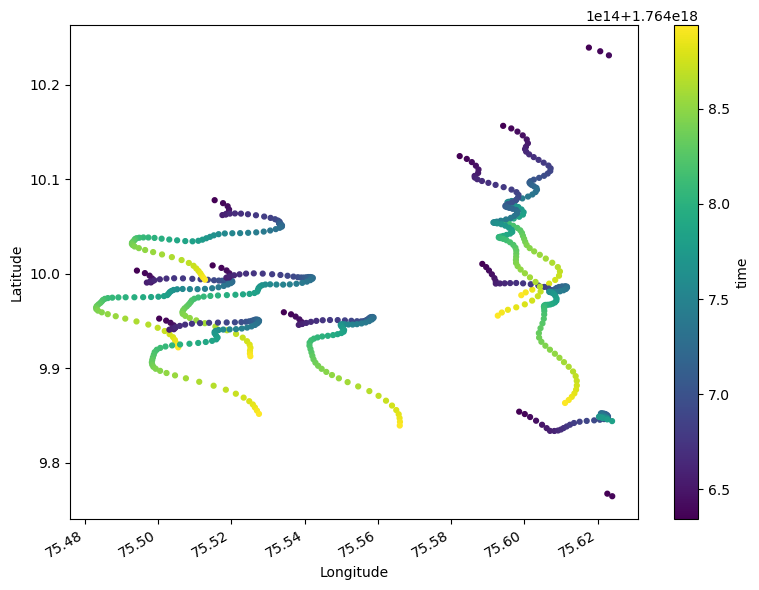

In [184]:
import matplotlib.pyplot as plt


plt.figure(figsize=(8, 6))
sc = plt.scatter(testdata['lon'], testdata['lat'], c=testdata['time'], cmap='viridis', marker='o', s=12)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a colorbar showing the time (formatted)
cbar = plt.colorbar(sc)
cbar.set_label('time')
cbar_ticks = cbar.get_ticks()
#cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])

plt.gcf().autofmt_xdate()
plt.show()


In [187]:
testdata.columns

Index(['trajectory', 'time', 'status', 'moving', 'age_seconds',
       'origin_marker', 'lon', 'lat', 'z', 'wind_drift_factor',
       'current_drift_factor', 'terminal_velocity', 'diameter', 'density',
       'dead', 'x_sea_water_velocity', 'y_sea_water_velocity',
       'sea_surface_height', 'sea_surface_wave_significant_height',
       'sea_ice_area_fraction', 'x_wind', 'y_wind', 'land_binary_mask',
       'sea_floor_depth_below_sea_level', 'ocean_vertical_diffusivity',
       'ocean_mixed_layer_thickness', 'sea_water_temperature',
       'sea_water_salinity', 'surface_downward_x_stress',
       'surface_downward_y_stress', 'turbulent_kinetic_energy',
       'turbulent_generic_length_scale', 'upward_sea_water_velocity', 'fe',
       'no3', 'po4', 'si', 'distance', 'growth'],
      dtype='object')

In [ ]:
# Ensure local package/module is importable (install editable if needed)

import os
import sys
import importlib.util
import numpy as np

# Path to the local module
module_path = "/Users/midhunshah/Documents/phytodrift/opendrift/phyt_growth.py"

# Load module from file
spec = importlib.util.spec_from_file_location("phyt_growth", module_path)
pg = importlib.util.module_from_spec(spec)
spec.loader.exec_module(pg)

# Prepare an array to store results
growth_results = np.zeros(len(testdata))

# Example usage
for i in range(len(testdata)):
    P0 = 3
    I  = 50
    N  = testdata['no3'].values[i]
    Ph = testdata['po4'].values[i]
    Fe = testdata['fe'].values[i]
    Si = testdata['si'].values[i]
    T  = testdata['sea_water_temperature'].values[i]

    # Call your function — ensure it returns something!
    result = pg.phyt_growth(P0, I, N, Ph, Fe, Si, T)

    # If result is a dict with 'dPdt', store it
    if isinstance(result, dict) and "dPdt" in result:
        growth_results[i] = result["dPdt"]
    else:
        growth_results[i] = np.nan  # fallback

# Assign to dataframe
testdata["growth"] = growth_results

# Show the last nutrient value (if needed)
testdata["no3"].iloc[-1]



1460     0.730303
1461     0.730303
1462     0.730303
1463     0.730303
1464     0.730303
           ...   
35473    0.730303
35474    0.730303
35475    0.730303
35476    0.730303
35477    0.730303
Name: si, Length: 631, dtype: float32

In [189]:
testdata['growth']

1460     0.202521
1461     0.202521
1462     0.202521
1463     0.202521
1464     0.202521
           ...   
35473    0.202521
35474    0.202521
35475    0.202521
35476    0.202521
35477    0.202521
Name: growth, Length: 631, dtype: float64

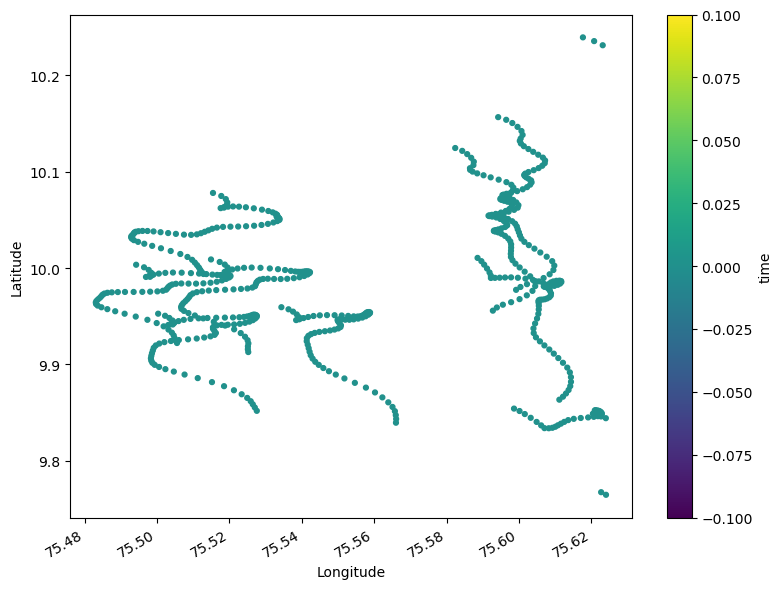

In [190]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert xarray Dataset to a DataFrame and bring the index levels (trajectory, time) into columns
#testdata = model_run.to_dataframe().reset_index()

# Color the scatter by time: convert datetimes to matplotlib numeric values
growth = mdates.date2num(testdata['growth'])

plt.figure(figsize=(8, 6))
sc = plt.scatter(testdata['lon'], testdata['lat'], c=growth, cmap='viridis', marker='o', s=12)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a colorbar showing the time (formatted)
cbar = plt.colorbar(sc)
cbar.set_label('time')
cbar_ticks = cbar.get_ticks()
#cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])

plt.gcf().autofmt_xdate()
plt.show()




